In [ ]:
import os
import numpy as np
import glob
import time
import PIL.Image as Image
from tqdm.notebook import tqdm
from itertools import chain
from collections import OrderedDict
import random
import pandas as pd
import torch
import torch.nn as nn
import torchvision.utils as vutils
import torchvision.datasets as dset
import torch.nn.functional as F
from torch.utils.data import (Dataset, DataLoader)  # gives easier dataset managment and creates mini batches
import torchvision.transforms as transforms
import matplotlib.pylab as plt
import ipywidgets
from IPython import display
from skimage import io
import torch.nn.parallel
import torch.optim as optim
%matplotlib inline

In [ ]:
# alter info.csv and save as info2.csv

df = pd.read_csv('colposcopy/info.csv')
df.loc[df.label != 0, 'label'] = 1
df.image_name = df.image_name.astype(str) + '.jpg'
df.to_csv('colposcopy/info2.csv', index=False)

# can also split to separate files
df0 = df[df.label == 0]
df1 = df[df.label == 1]
df0.to_csv('colposcopy/info_0.csv', index=False)
df1.to_csv('colposcopy/info_1.csv', index=False)

df

,image_name,Age,HPV status,TZ_Type,Solution,label
0,186_4.jpg,44,0.0,1.0,iodine,0
1,147_1.jpg,38,1.0,3.0,saline,1
2,3_1.jpg,37,0.0,1.0,acetic,0
3,71_1.jpg,30,0.0,1.0,saline,0
4,83_5.jpg,38,0.0,1.0,acetic,0
...,...,...,...,...,...,...
708,72_4.jpg,33,0.0,1.0,acetic,0
709,69_2.jpg,30,0.0,1.0,saline,0
710,217_1.jpg,40,0.0,1.0,saline,0
711,124_7.jpg,34,1.0,1.0,acetic,1


In [ ]:
if torch.cuda.is_available():
    print("The code will run on GPU.")
else:
    print("The code will run on CPU. Go to Edit->Notebook Settings and choose GPU as the hardware accelerator")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

The code will run on GPU.


In [ ]:
# define dataset classes
class ColposcopyDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.annotations = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform
    
    def __len__(self):
        return len(self.annotations)
    
    def __getitem__(self, index):
        
        img_path = os.path.join(self.root_dir, self.annotations.iloc[index, 0])  # fpath 1st col
        image = io.imread(img_path)
        y_label = torch.tensor(int(self.annotations.iloc[index, 5]))  # because label is 6th col
        
        if self.transform:
            image = self.transform(image)
        
        return (image, y_label)

In [ ]:
bs = 1
workers = 2
image_size = (256,256)

# Load Data
dataset_0_train = ColposcopyDataset(
    csv_file="/colposcopy/0_folder/info_0.csv",
    root_dir="/colposcopy",
    transform=transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.RandomRotation(5.6), # .05 rad
        transforms.ToTensor(),
        transforms.Normalize((0, 0, 0), (1, 1, 1)),
        ]))

dataset_0_test = ColposcopyDataset(
    csv_file="/colposcopy/0_folder/info_0.csv",
    root_dir="/colposcopy",
    transform=transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.RandomRotation(5.6), # .05 rad
        transforms.ToTensor(),
        transforms.Normalize((0, 0, 0), (1, 1, 1)),
        ]))

dataset_1_train = ColposcopyDataset(
    csv_file="/colposcopy/1_folder/info_1.csv",
    root_dir="/colposcopy",
    transform=transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.RandomRotation(5.6), # .05 rad
        transforms.ToTensor(),
        transforms.Normalize((0, 0, 0), (1, 1, 1)),
        ]))

dataset_1_test = ColposcopyDataset(
    csv_file="/colposcopy/1_folder/info_1.csv",
    root_dir="/colposcopy",
    transform=transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(image_size),
        transforms.CenterCrop(image_size),
        transforms.RandomRotation(5.6), # .05 rad
        transforms.ToTensor(),
        transforms.Normalize((0, 0, 0), (1, 1, 1)),
        ]))

torch.Size([1, 3, 256, 256])


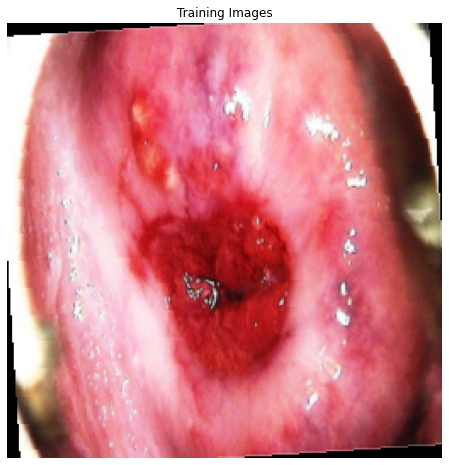

In [ ]:
train_loader_0 = torch.utils.data.DataLoader(dataset_0_train, batch_size=bs,
                                         shuffle=True, num_workers=workers)
real_batch = next(iter(train_loader_0))
print(real_batch[0].shape)
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:10], padding=2, normalize=True).cpu(),(1,2,0)))

torch.Size([1, 3, 256, 256])


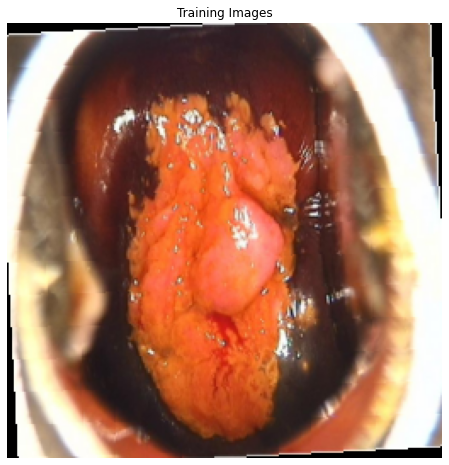

In [ ]:
test_loader_0 = torch.utils.data.DataLoader(dataset_0_test, batch_size=bs,
                                         shuffle=True, num_workers=workers)
real_batch = next(iter(test_loader_0))
print(real_batch[0].shape)
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:10], padding=2, normalize=True).cpu(),(1,2,0)))

torch.Size([1, 3, 256, 256])


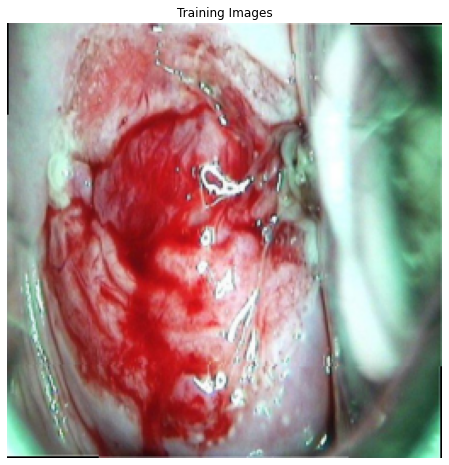

In [ ]:
train_loader_1 = torch.utils.data.DataLoader(dataset_1_train, batch_size=bs,
                                         shuffle=True, num_workers=workers)
real_batch = next(iter(train_loader_1))
print(real_batch[0].shape)
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:10], padding=2, normalize=True).cpu(),(1,2,0)))

torch.Size([1, 3, 256, 256])


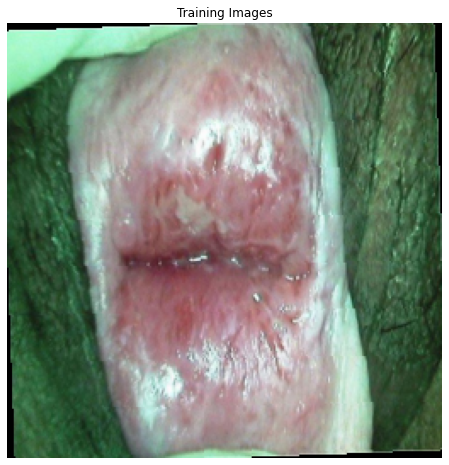

In [ ]:
test_loader_1 = torch.utils.data.DataLoader(dataset_1_test, batch_size=bs,
                                         shuffle=True, num_workers=workers)
real_batch = next(iter(test_loader_1))
print(real_batch[0].shape)
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:10], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
def plot_images_test(test_loader_0, test_loader_1): 
    batch_a_test = next(iter(test_loader_0))[0].to(device)
    real_a_test = batch_a_test.cpu().detach()
    fake_b_test = G_A2B(batch_a_test ).cpu().detach()


    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((real_a_test[:4]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Real 0 labels")
    plt.show()

          
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((fake_b_test[:4]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Fake 1 labels")
    plt.show()


    batch_b_test = next(iter(test_loader_1))[0].to(device)
    real_b_test = batch_b_test.cpu().detach()
    fake_a_test = G_B2A(batch_b_test ).cpu().detach()
    
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((real_b_test[:4]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Real 1 labels")
    plt.show()


    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((fake_a_test[:4]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Fake 0 labels")
    plt.show()

In [ ]:
def plot_all_images(image_number, test_loader_0, test_loader_1): 
    #generate fake 1 labels
    batch_a_test = next(iter(test_loader_0))[0].to(device)
    real_a_test = batch_a_test.cpu().detach()
    fake_b_test = G_A2B(batch_a_test ).cpu().detach()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((real_a_test[:image_number]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Real 0 labels")
    plt.show()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((fake_b_test[:image_number]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Fake 1 labels")
    plt.show()
    #generate fake 0 labels
    batch_b_test = next(iter(test_loader_1))[0].to(device)
    real_b_test = batch_b_test.cpu().detach()
    fake_a_test = G_B2A(batch_b_test ).cpu().detach()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((real_b_test[:image_number]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Real 1 labels")
    plt.show()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((fake_a_test[:image_number]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Fake 0 labels")
    plt.show()
    #identity 
    identity_a_test=G_B2A(batch_a_test.cuda() ).cpu().detach()
    identity_b_test=G_A2B(batch_b_test.cuda() ).cpu().detach()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((identity_a_test[:image_number]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Identity 0 labels")
    plt.show()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((identity_b_test[:image_number]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Identity 1 labels")
    plt.show()
    #recovered image
    recover_a_test=G_B2A(fake_b_test.cuda()  ).cpu().detach()
    recover_b_test=G_A2B(fake_a_test.cuda()  ).cpu().detach()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((recover_a_test[:image_number]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Recovered 0 labels")
    plt.show()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(vutils.make_grid((recover_b_test[:image_number]+1)/2, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.axis("off")
    plt.title("Recovered 1 labels")
    plt.show()

In [ ]:
def save_models(G_A2B, G_B2A, D_A, D_B, name):

  torch.save(G_A2B, "colposcopy"+name+"_G_A2B.pt")
  torch.save(G_B2A, "colposcopy"+name+"_G_B2A.pt")
  torch.save(D_A, "colposcopy"+name+"_D_A.pt")
  torch.save(D_B, "colposcopy"+name+"_D_B.pt")

def load_models( name):

  G_A2B=torch.load("colposcopy"+name+"_G_A2B.pt")
  G_B2A=torch.load("colposcopy"+name+"_G_B2A.pt")
  D_A=torch.load("colposcopy"+name+"_D_A.pt")
  D_B=torch.load("colposcopy"+name+"_D_B.pt")
  return G_A2B, G_B2A, D_A, D_B

#save_models(G_A2B, G_B2A, D_A, D_B, "test")
#G_A2B, G_B2A, D_A, D_B= load_models("test")

In [ ]:
norm_layer = nn.InstanceNorm2d
class ResBlock(nn.Module):
    def __init__(self, f):
        super(ResBlock, self).__init__()
        self.conv = nn.Sequential(nn.Conv2d(f, f, 3, 1, 1), norm_layer(f), nn.ReLU(),
                                  nn.Conv2d(f, f, 3, 1, 1))
        self.norm = norm_layer(f)
    def forward(self, x):
        return F.relu(self.norm(self.conv(x)+x))

class Generator(nn.Module):
    def __init__(self, f=64, blocks=9):
        super(Generator, self).__init__()
        layers = [nn.ReflectionPad2d(3),
                  nn.Conv2d(  3,   f, 7, 1, 0), norm_layer(  f), nn.ReLU(True),
                  nn.Conv2d(  f, 2*f, 3, 2, 1), norm_layer(2*f), nn.ReLU(True),
                  nn.Conv2d(2*f, 4*f, 3, 2, 1), norm_layer(4*f), nn.ReLU(True)]
        for i in range(int(blocks)):
            layers.append(ResBlock(4*f))
        layers.extend([
                nn.ConvTranspose2d(4*f, 4*2*f, 3, 1, 1), nn.PixelShuffle(2), norm_layer(2*f), nn.ReLU(True),
                nn.ConvTranspose2d(2*f,   4*f, 3, 1, 1), nn.PixelShuffle(2), norm_layer(  f), nn.ReLU(True),
                nn.ReflectionPad2d(3), nn.Conv2d(f, 3, 7, 1, 0),
                nn.Tanh()])
        self.conv = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.conv(x)

In [ ]:
nc=3
ndf=64
class Discriminator(nn.Module):  
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is (nc) x 128 x 128
            nn.Conv2d(nc,ndf,4,2,1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 64 x 64
            nn.Conv2d(ndf,ndf*2,4,2,1, bias=False),
            nn.InstanceNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 32 x 32
            nn.Conv2d(ndf*2, ndf * 4, 4, 2, 1, bias=False),
            nn.InstanceNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 16 x 16
            nn.Conv2d(ndf*4,ndf*8,4,1,1),
            nn.InstanceNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 15 x 15
            nn.Conv2d(ndf*8,1,4,1,1)
            # state size. 1 x 14 x 14
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
def LSGAN_D(real, fake):
  return (torch.mean((real - 1)**2) + torch.mean(fake**2))

def LSGAN_G(fake):
  return  torch.mean((fake - 1)**2)

In [ ]:
G_A2B = Generator().to(device)
G_B2A = Generator().to(device)
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

# Initialize Loss function
criterion_Im = torch.nn.L1Loss() 

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Optimizers

In [ ]:
def training(G_A2B, G_B2A, D_A, D_B,num_epochs,name,old = True):

  

  # Training Loop

  # Lists to keep track of progress
  img_list = []
  G_losses = []
  D_A_losses = []
  D_B_losses = []


  iters=0
  FDL_A2B = []
  FDL_B2A = []
  CL_A = []
  CL_B = []
  ID_B2A = []
  ID_A2B = []
  disc_A = []
  disc_B = []


  FDL_A2B_t = []
  FDL_B2A_t = []
  CL_A_t = []
  CL_B_t = []
  ID_B2A_t = []
  ID_A2B_t = []
  disc_A_t = []
  disc_B_t = []

  print("Starting Training Loop...")
  # For each epoch
  for epoch in range(num_epochs):

    # For each batch in the dataloader
    for  i,(data_0, data_1) in enumerate(zip(train_loader_0, train_loader_1),0):
    
        # Set model input
        a_real = data_0[0].to(device)
        b_real = data_1[0].to(device)
      
        tensor_ones=torch.ones([a_real.shape[0],1,14,14]).cuda()
        tensor_zeros=torch.zeros([a_real.shape[0],1,14,14]).cuda()

        # Genrated images
        b_fake = G_A2B(a_real)
        a_rec = G_B2A(b_fake)
        a_fake = G_B2A(b_real)
        b_rec = G_A2B(a_fake)


        # Discriminator A
        optimizer_D_A.zero_grad()
        if((iters > 0 or epoch > 0) and old and iters % 3 == 0):
          rand_int = random.randint(1, old_a_fake.shape[0]-1)
          Disc_loss_A = LSGAN_D(D_A(a_real), D_A(old_a_fake[rand_int-5:rand_int].detach()))
          D_A_losses.append(Disc_loss_A.item())

        else:
          Disc_loss_A = LSGAN_D(D_A(a_real), D_A(a_fake.detach()))
          D_A_losses.append(Disc_loss_A.item())
        
        Disc_loss_A.backward()
        optimizer_D_A.step()

        
        # Discriminator B

        optimizer_D_B.zero_grad()
        if((iters > 0 or epoch > 0) and old and iters % 3 == 0):
          rand_int = random.randint(1, old_b_fake.shape[0]-1)
          Disc_loss_B =  LSGAN_D(D_B(b_real), D_B(old_b_fake[rand_int-5:rand_int].detach()))
          D_B_losses.append(Disc_loss_B.item())
        else:
          Disc_loss_B =  LSGAN_D(D_B(b_real), D_B(b_fake.detach()))
          D_B_losses.append(Disc_loss_B.item())

        Disc_loss_B.backward()
        optimizer_D_B.step()   

        # Generator

        optimizer_G_A2B.zero_grad()
        optimizer_G_B2A.zero_grad()


        # Fool discriminator
        Fool_disc_loss_A2B = LSGAN_G(D_B(b_fake))
        Fool_disc_loss_B2A = LSGAN_G(D_A(a_fake))

        # Cycle Consistency    both use the two generators
        Cycle_loss_A = criterion_Im(a_rec, a_real)*5
        Cycle_loss_B = criterion_Im(b_rec, b_real)*5

        # Identity loss
        Id_loss_B2A = criterion_Im(G_B2A(a_real), a_real)*10
        Id_loss_A2B = criterion_Im(G_A2B(b_real), b_real)*10

        # generator losses


        Loss_G = Fool_disc_loss_A2B+Fool_disc_loss_B2A+Cycle_loss_A+Cycle_loss_B+Id_loss_B2A+Id_loss_A2B
        G_losses.append(Loss_G)

        # Backward propagation
        Loss_G.backward()
        
        
        # Optimisation step
        optimizer_G_A2B.step()
        optimizer_G_B2A.step()

        FDL_A2B.append(Fool_disc_loss_A2B)
        FDL_B2A.append(Fool_disc_loss_B2A)
        CL_A.append(Cycle_loss_A)
        CL_B.append(Cycle_loss_B)
        ID_B2A.append(Id_loss_B2A)
        ID_A2B.append(Id_loss_A2B)
        disc_A.append(Disc_loss_A)
        disc_B.append(Disc_loss_B)

        if(iters == 0 and epoch == 0):
          old_b_fake = b_fake.clone()
          old_a_fake = a_fake.clone()
        elif (old_b_fake.shape[0] == bs*5 and b_fake.shape[0]==bs):
          rand_int = random.randint(1, 4)
          old_b_fake[rand_int-1:rand_int] = b_fake.clone()
          old_a_fake[rand_int-1:rand_int] = a_fake.clone()
        elif(old_b_fake.shape[0]< 25):
          old_b_fake = torch.cat((b_fake.clone(),old_b_fake))
          old_a_fake = torch.cat((a_fake.clone(),old_a_fake))

        iters += 1
        del data_1, data_0, a_real, b_real, a_fake, b_fake


        if iters % 50 == 0:
      
          print('[%d/%d]\tFDL_A2B: %.4f\tFDL_B2A: %.4f\tCL_A: %.4f\tCL_B: %.4f\tID_B2A: %.4f\tID_A2B: %.4f\tLoss_D_A: %.4f\tLoss_D_A: %.4f'
                      % (epoch+1, num_epochs, Fool_disc_loss_A2B, Fool_disc_loss_B2A,Cycle_loss_A,Cycle_loss_B,Id_loss_B2A,
                          Id_loss_A2B, Disc_loss_A.item(), Disc_loss_B.item()))
        

    FDL_A2B_t.append(sum(FDL_A2B)/len(FDL_A2B))
    FDL_B2A_t.append(sum(FDL_B2A)/len(FDL_B2A))
    CL_A_t.append(sum(CL_A)/len(CL_A))
    CL_B_t.append(sum(CL_B)/len(CL_B))
    ID_B2A_t.append(sum(ID_B2A)/len(ID_B2A))
    ID_A2B_t.append(sum(ID_A2B)/len(ID_A2B))
    disc_A_t.append(sum(disc_A)/len(disc_A))
    disc_B_t.append(sum(disc_B)/len(disc_B))

    FDL_A2B = []
    FDL_B2A = []
    CL_A = []
    CL_B = []
    ID_B2A = []
    ID_A2B = []
    disc_B = []
    disc_A = []

    iters = 0             
    save_models(G_A2B, G_B2A, D_A, D_B, name)
    if (epoch % 5 == 0):
      plot_images_test(test_loader_0, test_loader_1)
    #plot_all_images(4, 0_test_loader, 1_test_loader)
  return(FDL_A2B_t,FDL_B2A_t,CL_A_t,CL_B_t,ID_B2A_t,ID_A2B_t,disc_A_t,disc_B_t)

Starting Training Loop...
[1/50]	FDL_A2B: 0.3888	FDL_B2A: 0.2236	CL_A: 0.7710	CL_B: 0.9534	ID_B2A: 1.6236	ID_A2B: 1.6689	Loss_D_A: 0.5330	Loss_D_A: 0.6855
[1/50]	FDL_A2B: 0.2055	FDL_B2A: 0.1980	CL_A: 0.9217	CL_B: 0.9199	ID_B2A: 1.8204	ID_A2B: 1.8595	Loss_D_A: nan	Loss_D_A: nan
[1/50]	FDL_A2B: 0.3281	FDL_B2A: 0.3069	CL_A: 0.4635	CL_B: 0.7140	ID_B2A: 0.7993	ID_A2B: 1.2951	Loss_D_A: 0.5377	Loss_D_A: 0.5961
[1/50]	FDL_A2B: 0.3005	FDL_B2A: 0.1860	CL_A: 0.6431	CL_B: 0.5820	ID_B2A: 1.0332	ID_A2B: 1.0770	Loss_D_A: 0.6415	Loss_D_A: 0.5177
[1/50]	FDL_A2B: 0.3549	FDL_B2A: 0.1830	CL_A: 0.5772	CL_B: 1.2293	ID_B2A: 0.9837	ID_A2B: 2.3871	Loss_D_A: nan	Loss_D_A: nan
[1/50]	FDL_A2B: 0.3985	FDL_B2A: 0.3913	CL_A: 0.4663	CL_B: 1.0247	ID_B2A: 0.8699	ID_A2B: 1.7021	Loss_D_A: 0.6258	Loss_D_A: 0.5274


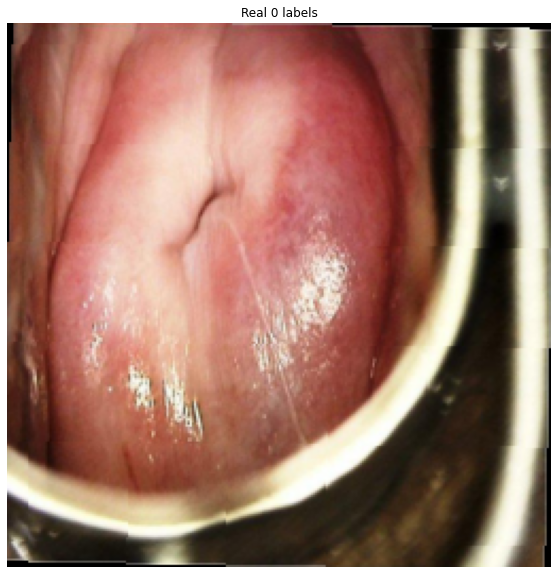

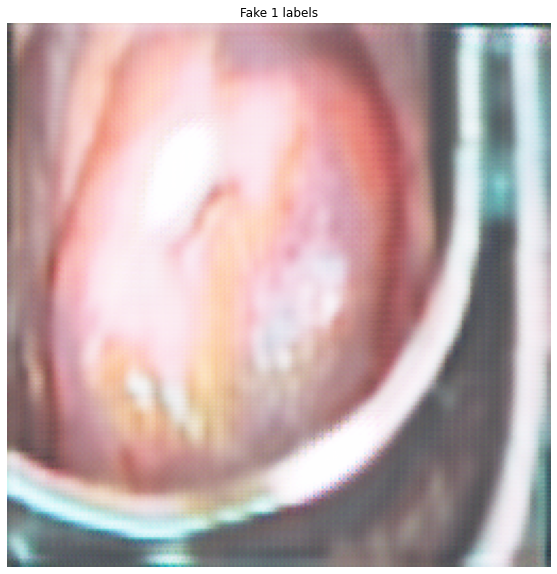

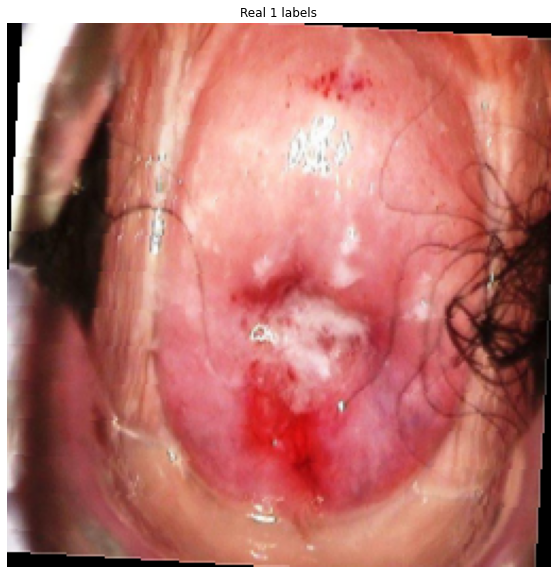

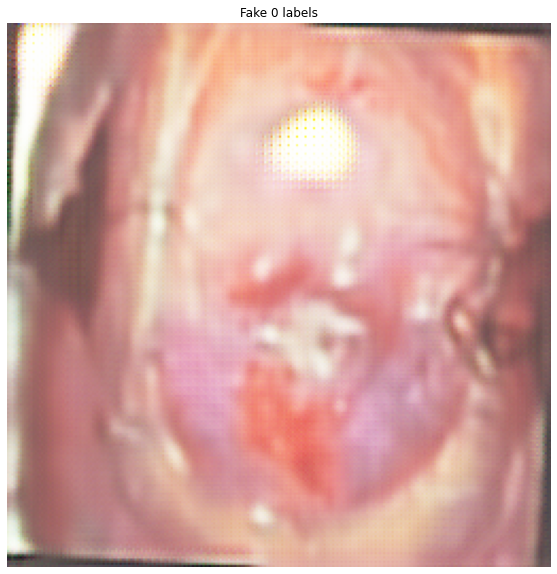

[2/50]	FDL_A2B: 0.2617	FDL_B2A: 0.2012	CL_A: 0.5811	CL_B: 0.6156	ID_B2A: 0.9253	ID_A2B: 0.9967	Loss_D_A: 0.5739	Loss_D_A: 0.4250
[2/50]	FDL_A2B: 0.0690	FDL_B2A: 0.2045	CL_A: 0.5981	CL_B: 0.5629	ID_B2A: 1.1641	ID_A2B: 1.1689	Loss_D_A: nan	Loss_D_A: nan
[2/50]	FDL_A2B: 0.3694	FDL_B2A: 0.5460	CL_A: 0.6373	CL_B: 0.4755	ID_B2A: 1.1571	ID_A2B: 0.8503	Loss_D_A: 0.4138	Loss_D_A: 0.6392
[2/50]	FDL_A2B: 0.3122	FDL_B2A: 0.2722	CL_A: 0.8605	CL_B: 0.7864	ID_B2A: 1.6397	ID_A2B: 1.2118	Loss_D_A: 0.5179	Loss_D_A: 0.4972
[2/50]	FDL_A2B: 0.1576	FDL_B2A: 0.0528	CL_A: 0.3918	CL_B: 0.3666	ID_B2A: 0.7330	ID_A2B: 0.6518	Loss_D_A: nan	Loss_D_A: nan
[2/50]	FDL_A2B: 0.3254	FDL_B2A: 0.3300	CL_A: 0.4356	CL_B: 0.5007	ID_B2A: 0.7822	ID_A2B: 0.9203	Loss_D_A: 0.5067	Loss_D_A: 0.5312
[3/50]	FDL_A2B: 0.3285	FDL_B2A: 0.2299	CL_A: 0.4146	CL_B: 0.4669	ID_B2A: 0.7322	ID_A2B: 0.7496	Loss_D_A: 0.7820	Loss_D_A: 0.4046
[3/50]	FDL_A2B: 0.0755	FDL_B2A: 0.1539	CL_A: 0.5827	CL_B: 0.3471	ID_B2A: 1.1461	ID_A2B: 0.5855	Loss_D_A: nan	

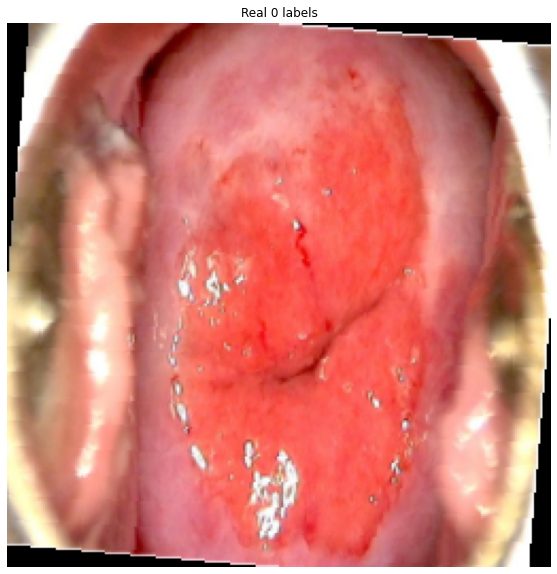

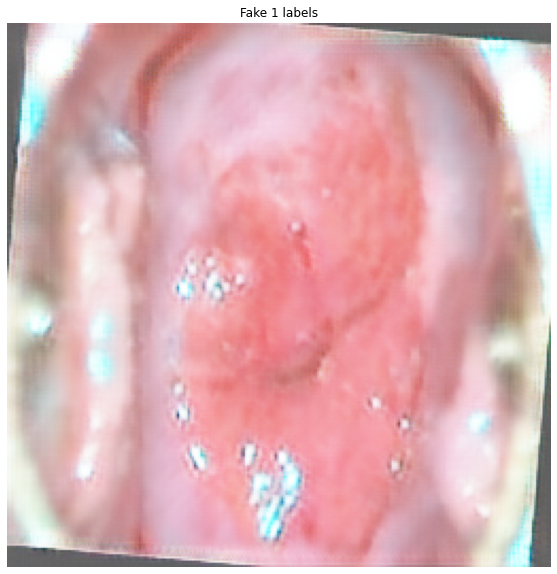

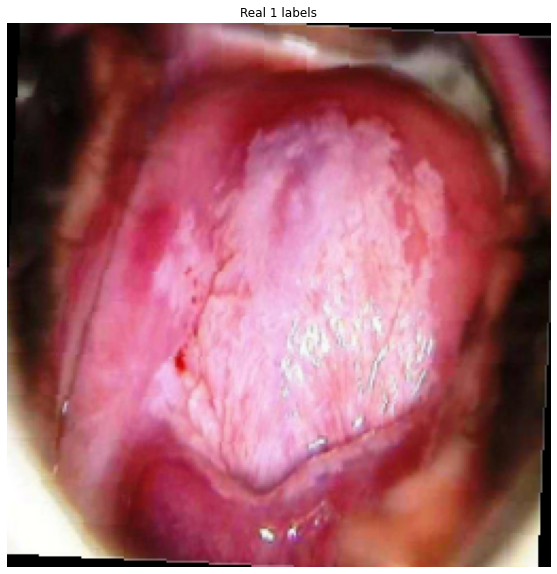

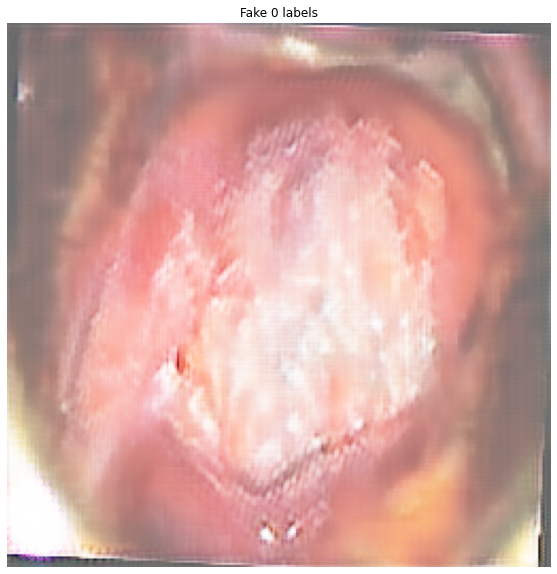

[7/50]	FDL_A2B: 0.2870	FDL_B2A: 0.2310	CL_A: 0.4564	CL_B: 0.3715	ID_B2A: 0.7609	ID_A2B: 0.7683	Loss_D_A: 0.5149	Loss_D_A: 0.4115
[7/50]	FDL_A2B: 0.1404	FDL_B2A: 0.1574	CL_A: 0.3423	CL_B: 0.2934	ID_B2A: 0.5301	ID_A2B: 0.4864	Loss_D_A: nan	Loss_D_A: nan
[7/50]	FDL_A2B: 0.3591	FDL_B2A: 0.4373	CL_A: 0.3036	CL_B: 0.3245	ID_B2A: 0.5012	ID_A2B: 0.5210	Loss_D_A: 0.4858	Loss_D_A: 0.3383
[7/50]	FDL_A2B: 0.3290	FDL_B2A: 0.1651	CL_A: 0.4992	CL_B: 0.4413	ID_B2A: 0.9707	ID_A2B: 0.5077	Loss_D_A: 0.7228	Loss_D_A: 0.6707
[7/50]	FDL_A2B: 0.2575	FDL_B2A: 0.1603	CL_A: 0.3194	CL_B: 0.4449	ID_B2A: 0.5551	ID_A2B: 0.7356	Loss_D_A: nan	Loss_D_A: nan
[7/50]	FDL_A2B: 0.2362	FDL_B2A: 0.4098	CL_A: 0.5016	CL_B: 0.3550	ID_B2A: 0.5992	ID_A2B: 0.6218	Loss_D_A: 0.5519	Loss_D_A: 0.5027
[8/50]	FDL_A2B: 0.1996	FDL_B2A: 0.1815	CL_A: 0.6673	CL_B: 0.2485	ID_B2A: 1.2981	ID_A2B: 0.5112	Loss_D_A: 0.5552	Loss_D_A: 0.6227
[8/50]	FDL_A2B: 0.1254	FDL_B2A: 0.1922	CL_A: 0.5959	CL_B: 0.5664	ID_B2A: 0.9523	ID_A2B: 0.6177	Loss_D_A: nan	

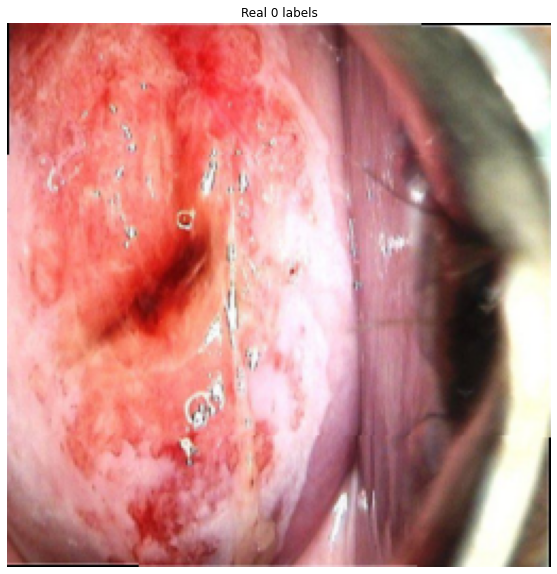

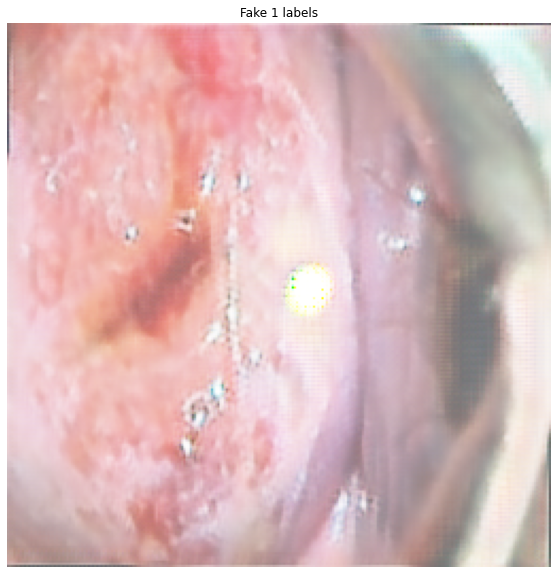

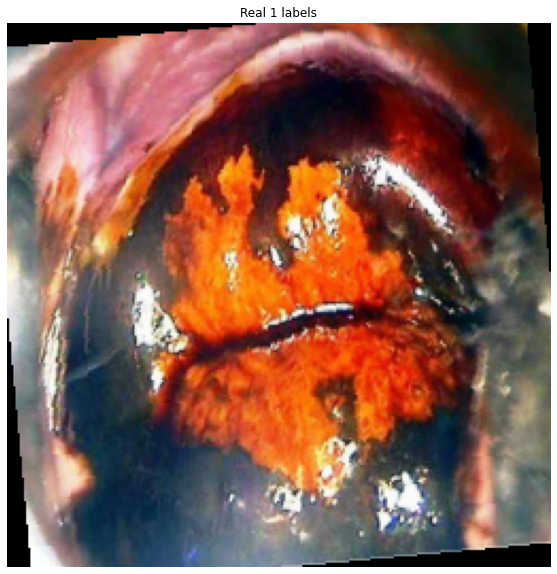

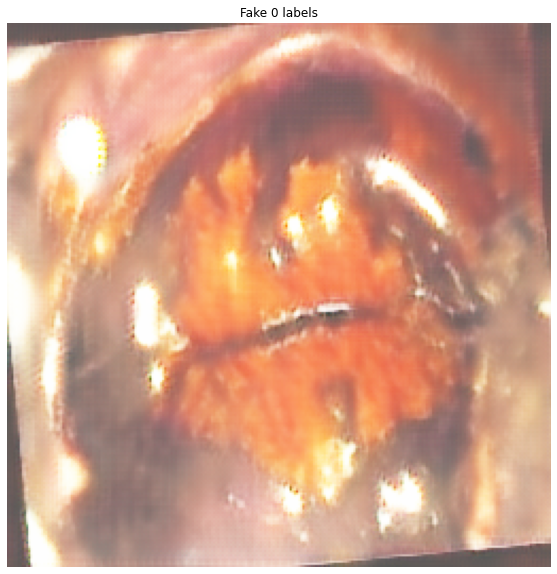

[12/50]	FDL_A2B: 0.2247	FDL_B2A: 0.2318	CL_A: 0.5304	CL_B: 0.2408	ID_B2A: 1.1816	ID_A2B: 0.4202	Loss_D_A: 0.5251	Loss_D_A: 0.5212
[12/50]	FDL_A2B: 0.2313	FDL_B2A: 0.0885	CL_A: 0.2793	CL_B: 0.2370	ID_B2A: 0.4913	ID_A2B: 0.4431	Loss_D_A: nan	Loss_D_A: nan
[12/50]	FDL_A2B: 0.3760	FDL_B2A: 0.3658	CL_A: 0.2572	CL_B: 0.2661	ID_B2A: 0.4750	ID_A2B: 0.5406	Loss_D_A: 0.5301	Loss_D_A: 0.3909
[12/50]	FDL_A2B: 0.3474	FDL_B2A: 0.2179	CL_A: 0.2916	CL_B: 0.3564	ID_B2A: 0.3942	ID_A2B: 0.6321	Loss_D_A: 0.5418	Loss_D_A: 0.4180
[12/50]	FDL_A2B: 0.2109	FDL_B2A: 0.1751	CL_A: 0.3510	CL_B: 0.2351	ID_B2A: 0.6466	ID_A2B: 0.4314	Loss_D_A: nan	Loss_D_A: nan
[12/50]	FDL_A2B: 0.2530	FDL_B2A: 0.3403	CL_A: 0.2284	CL_B: 0.2325	ID_B2A: 0.3769	ID_A2B: 0.3945	Loss_D_A: 0.4331	Loss_D_A: 0.4608
[13/50]	FDL_A2B: 0.2246	FDL_B2A: 0.2974	CL_A: 0.2840	CL_B: 0.2833	ID_B2A: 0.4744	ID_A2B: 0.3827	Loss_D_A: 0.3844	Loss_D_A: 0.5049
[13/50]	FDL_A2B: 0.0872	FDL_B2A: 0.2206	CL_A: 0.2759	CL_B: 0.4370	ID_B2A: 0.3922	ID_A2B: 0.7211	Loss_D

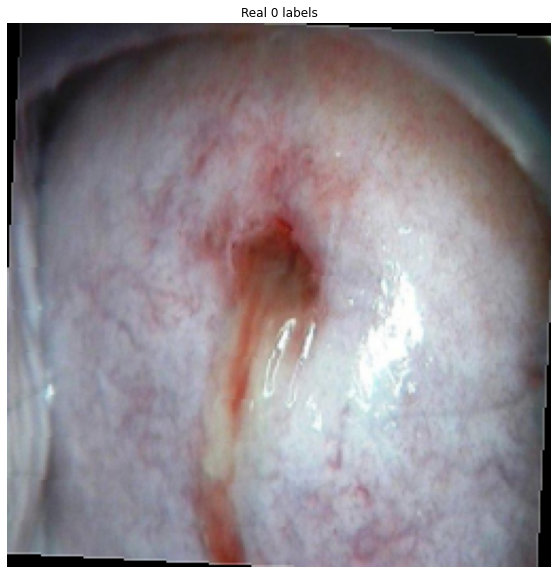

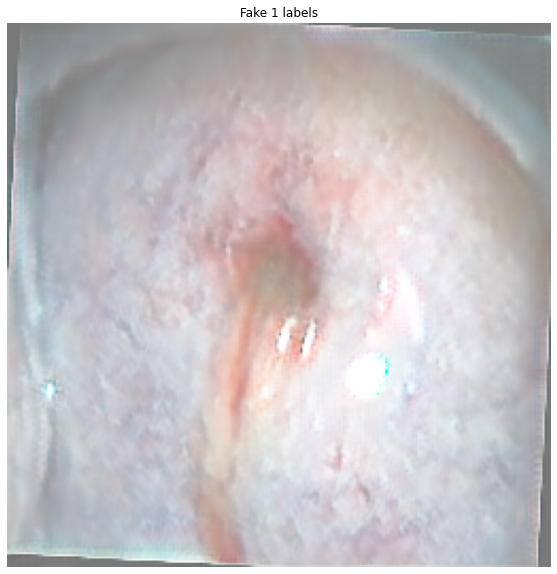

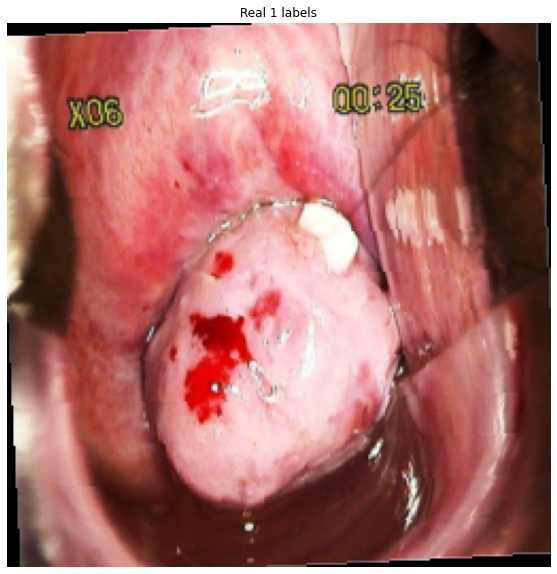

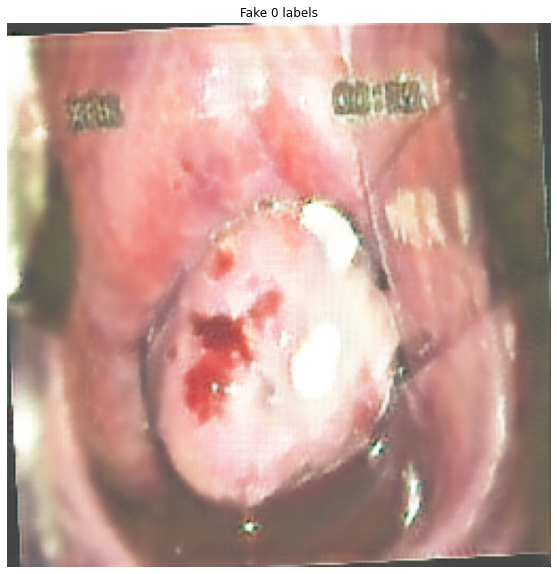

[17/50]	FDL_A2B: 0.2150	FDL_B2A: 0.2840	CL_A: 0.2097	CL_B: 0.2201	ID_B2A: 0.3530	ID_A2B: 0.5262	Loss_D_A: 0.4110	Loss_D_A: 0.4854
[17/50]	FDL_A2B: 0.2351	FDL_B2A: 0.1527	CL_A: 0.2853	CL_B: 0.2021	ID_B2A: 0.4486	ID_A2B: 0.2530	Loss_D_A: nan	Loss_D_A: nan
[17/50]	FDL_A2B: 0.3092	FDL_B2A: 0.3109	CL_A: 0.2929	CL_B: 0.3065	ID_B2A: 0.4857	ID_A2B: 0.3645	Loss_D_A: 0.4696	Loss_D_A: 0.4601
[17/50]	FDL_A2B: 0.1529	FDL_B2A: 0.3155	CL_A: 0.3668	CL_B: 0.3115	ID_B2A: 0.6191	ID_A2B: 0.3668	Loss_D_A: 0.4145	Loss_D_A: 0.8871
[17/50]	FDL_A2B: 0.1742	FDL_B2A: 0.3085	CL_A: 0.2852	CL_B: 0.1981	ID_B2A: 0.4477	ID_A2B: 0.2995	Loss_D_A: nan	Loss_D_A: nan
[17/50]	FDL_A2B: 0.4159	FDL_B2A: 0.4475	CL_A: 0.3269	CL_B: 0.3050	ID_B2A: 0.5378	ID_A2B: 0.4972	Loss_D_A: 0.2474	Loss_D_A: 0.2991
[18/50]	FDL_A2B: 0.2425	FDL_B2A: 0.3028	CL_A: 0.2689	CL_B: 0.3775	ID_B2A: 0.3784	ID_A2B: 0.6203	Loss_D_A: 0.4267	Loss_D_A: 0.4495
[18/50]	FDL_A2B: 0.1377	FDL_B2A: 0.0746	CL_A: 0.2928	CL_B: 0.2763	ID_B2A: 0.5376	ID_A2B: 0.4464	Loss_D

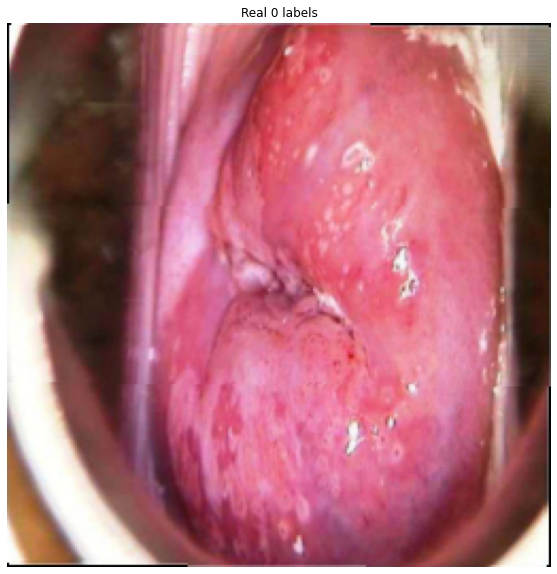

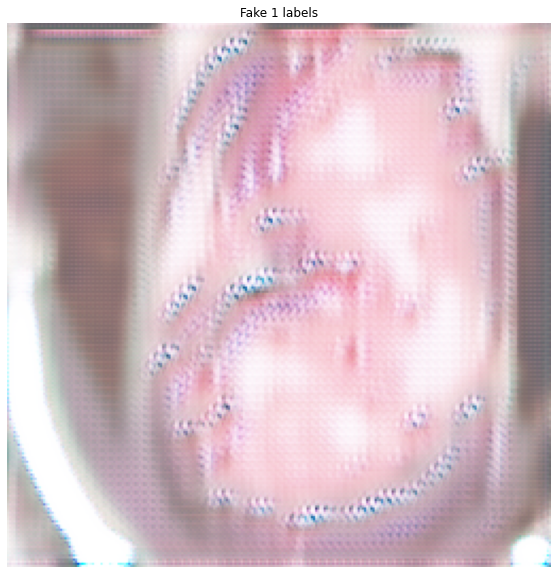

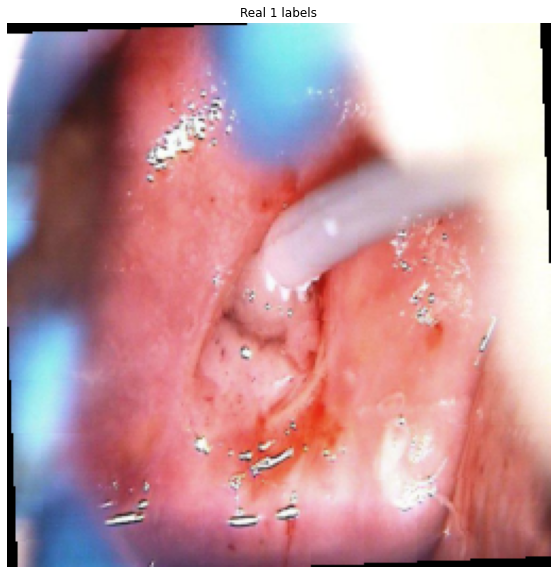

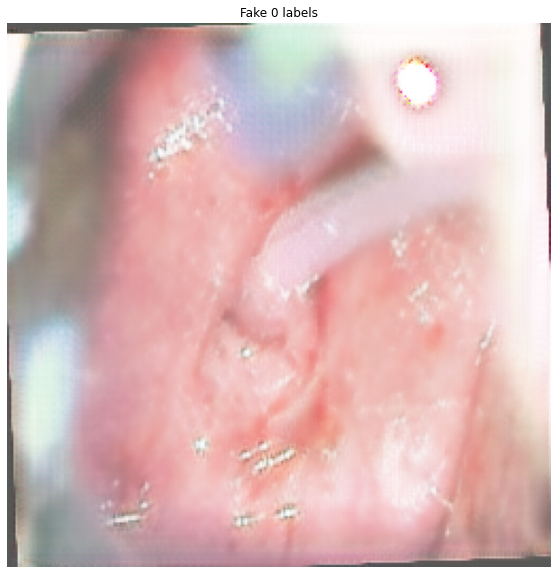

[22/50]	FDL_A2B: 0.6296	FDL_B2A: 0.2751	CL_A: 0.5916	CL_B: 0.4013	ID_B2A: 0.4727	ID_A2B: 0.8056	Loss_D_A: 0.3663	Loss_D_A: 0.3260
[22/50]	FDL_A2B: 0.2585	FDL_B2A: 0.1106	CL_A: 0.4449	CL_B: 0.5793	ID_B2A: 0.3873	ID_A2B: 1.1660	Loss_D_A: nan	Loss_D_A: nan
[22/50]	FDL_A2B: 0.7103	FDL_B2A: 0.3327	CL_A: 0.6314	CL_B: 0.4719	ID_B2A: 0.5222	ID_A2B: 0.9994	Loss_D_A: 0.4320	Loss_D_A: 0.2675
[22/50]	FDL_A2B: 0.5341	FDL_B2A: 0.1991	CL_A: 0.6004	CL_B: 0.4234	ID_B2A: 0.5700	ID_A2B: 0.7880	Loss_D_A: 0.7054	Loss_D_A: 0.2640
[22/50]	FDL_A2B: 0.8863	FDL_B2A: 0.3779	CL_A: 0.4444	CL_B: 0.5525	ID_B2A: 0.6309	ID_A2B: 1.0625	Loss_D_A: nan	Loss_D_A: nan
[22/50]	FDL_A2B: 0.5820	FDL_B2A: 0.3509	CL_A: 0.5262	CL_B: 0.5199	ID_B2A: 0.4503	ID_A2B: 1.0128	Loss_D_A: 0.4885	Loss_D_A: 0.3676
[23/50]	FDL_A2B: 0.7578	FDL_B2A: 0.2262	CL_A: 0.3364	CL_B: 0.8593	ID_B2A: 0.4321	ID_A2B: 1.7098	Loss_D_A: 0.6915	Loss_D_A: 0.1155
[23/50]	FDL_A2B: 0.6472	FDL_B2A: 0.2744	CL_A: 0.4588	CL_B: 0.7951	ID_B2A: 0.4296	ID_A2B: 1.6082	Loss_D

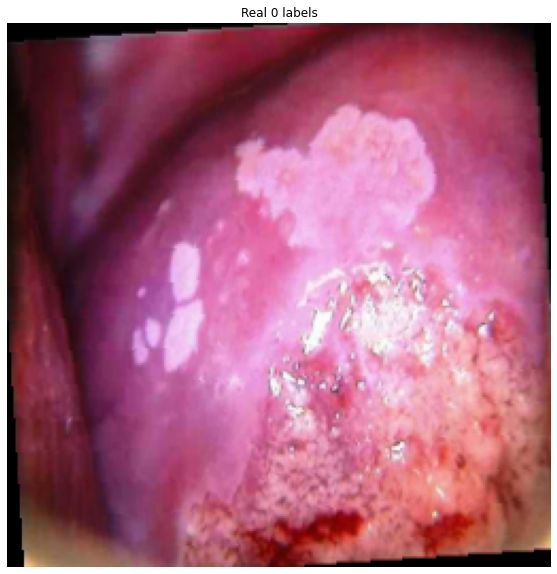

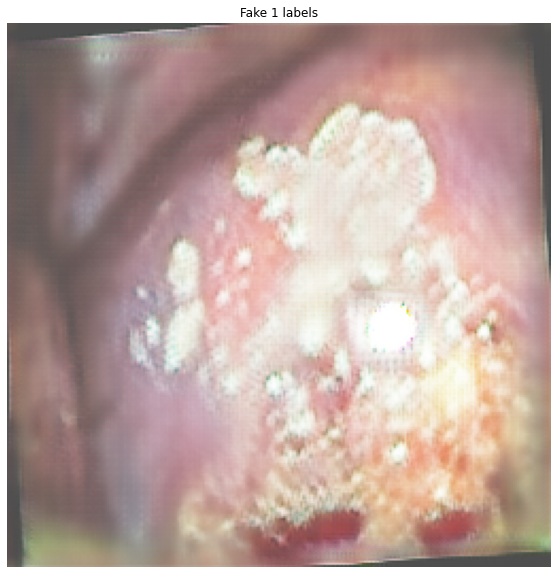

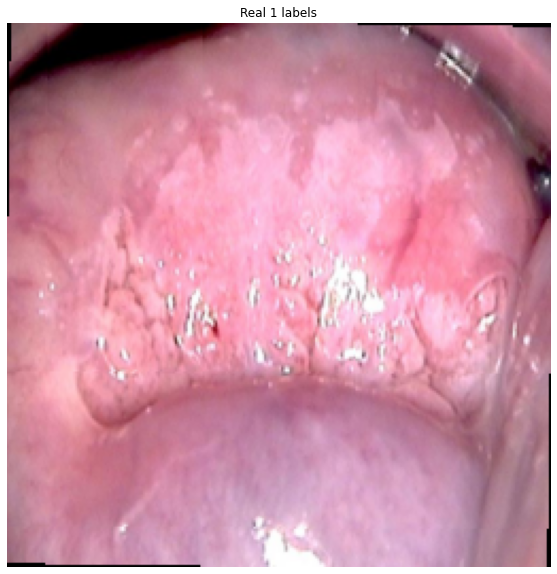

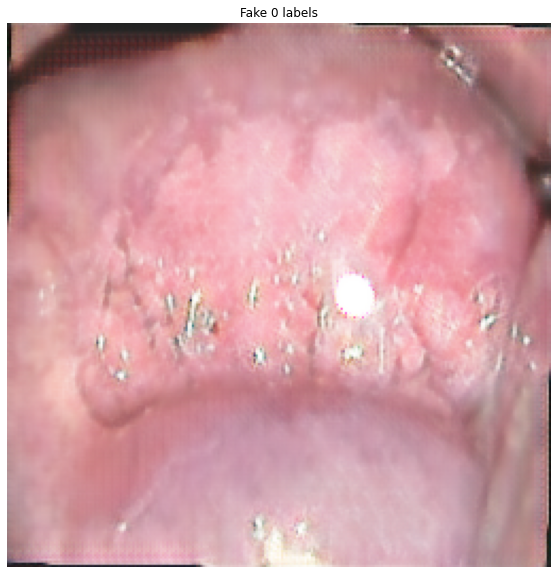

[27/50]	FDL_A2B: 0.5919	FDL_B2A: 0.3287	CL_A: 0.4501	CL_B: 0.4433	ID_B2A: 0.6417	ID_A2B: 0.7252	Loss_D_A: 0.5451	Loss_D_A: 0.2644
[27/50]	FDL_A2B: 0.4724	FDL_B2A: 0.2309	CL_A: 0.2435	CL_B: 0.4533	ID_B2A: 0.3618	ID_A2B: 1.0093	Loss_D_A: nan	Loss_D_A: nan
[27/50]	FDL_A2B: 0.6993	FDL_B2A: 0.3590	CL_A: 0.2578	CL_B: 0.3179	ID_B2A: 0.3067	ID_A2B: 0.6050	Loss_D_A: 0.4511	Loss_D_A: 0.2136
[27/50]	FDL_A2B: 0.3944	FDL_B2A: 0.3699	CL_A: 0.5528	CL_B: 0.5176	ID_B2A: 0.7021	ID_A2B: 0.8971	Loss_D_A: 0.3122	Loss_D_A: 0.2911
[27/50]	FDL_A2B: 0.2018	FDL_B2A: 0.1771	CL_A: 0.3225	CL_B: 0.2776	ID_B2A: 0.4214	ID_A2B: 0.5637	Loss_D_A: nan	Loss_D_A: nan
[27/50]	FDL_A2B: 0.5340	FDL_B2A: 0.3087	CL_A: 0.2989	CL_B: 0.3397	ID_B2A: 0.4132	ID_A2B: 0.6613	Loss_D_A: 0.4776	Loss_D_A: 0.2949
[28/50]	FDL_A2B: 0.2996	FDL_B2A: 0.2683	CL_A: 0.4255	CL_B: 0.3673	ID_B2A: 0.2783	ID_A2B: 0.7511	Loss_D_A: 0.5199	Loss_D_A: 0.4996
[28/50]	FDL_A2B: 0.1106	FDL_B2A: 0.2173	CL_A: 0.4388	CL_B: 0.2717	ID_B2A: 0.5780	ID_A2B: 0.4696	Loss_D

In [ ]:
name="Basic9_old_256_training50"
#name="Basic9_training50"
#name = 'basic_training50'
epochs=50
netG_A2B, netG_B2A, netD_A, netD_B=G_A2B, G_B2A, D_A, D_B

optimizer_G_A2B = torch.optim.Adam(G_A2B.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_G_B2A = torch.optim.Adam(G_B2A.parameters(), lr=lr, betas=(beta1, 0.999))

optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr, betas=(beta1, 0.999))
optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr, betas=(beta1, 0.999))

losses = training( netG_A2B, netG_B2A, netD_A, netD_B,epochs,name)

In [ ]:
name="Basic9_old_256_training50"
#name="Basic9_old_training50"
#name="Basic9_training50"
#name = 'basic_training50'
G_A2B, G_B2A, D_A, D_B = load_models(name)

In [ ]:
for i,t in 0_train_loader:
  break

In [ ]:
len(0_train_loader)

In [ ]:
i[0:2] = i[2:4]

In [ ]:
sum(sum(sum(i[0] == i[2])))

In [ ]:
i.shape

In [ ]:
i.shape[0]

In [ ]:
torch.cat((i,i),0).shape

In [ ]:
import random
random.randint(0, 3)